In [2]:
import time
import random
from tqdm.notebook import tqdm


import cv2
from PIL import Image
from matplotlib import image

import torch
import numpy as np

from matplotlib import pyplot as plt

In [3]:
torch.cuda.empty_cache()

In [4]:
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [6]:
PRIOR2 = "GP" #gaussian prior

In [7]:
PATH_IMG = "28546.jpg" # Change this accordingly

# Row x Column format is used everywhere

SHAPE_ORIG_HR = [172, 172] # original HR shape
SHAPE_PATCH_HR = [60, 60] # shape of the HR patch

UPSCALE_FACTOR = 4

SHAPE_ORIG_LR = [dim//UPSCALE_FACTOR for dim in SHAPE_ORIG_HR]
SHAPE_PATCH_LR = [dim//UPSCALE_FACTOR for dim in SHAPE_PATCH_HR]

K = 16
SIGMA_AGN = 0.01

# Functions

## General Functions

In [8]:
def relChange(prev, next):
    """ Returns the % relative change """
    return ((prev - next) / prev)

In [9]:
def gpuMem(t):
    """ Outputs the memory occupied in MB on the GPU/CPU by the tensor t """
    mem = t.element_size() * t.nelement() # in bytes
    return mem / 10**6

In [10]:
def load(path):
    """ Reads an image and performs pre-processing """
    img = cv2.imread(path, 0) # Read in grayscale
    img = Image.fromarray(img) # Convert to PIL Image for downsizing
    img = img.resize((SHAPE_HR[1], SHAPE_HR[0]), Image.ANTIALIAS) 
    img = np.asarray(img) # Back to NumPy
    img = img.reshape(N, 1) # Unroll
    img = torch.from_numpy(img.copy()).to(DEVICE) # Convert to torch tensor
    img = img.float() # To FloatTensor
    img = scale(img) # Scale values in [-1/2, 1/2] as specified in the paper
    return img

In [11]:

def disp(img, out_path=None):
    """ Displays an image, and saves it to out_path if specified """

    # Convert to NumPy array
    if isinstance(img, torch.Tensor):
        if img.requires_grad:
            # Detach the tensor from the computation graph
            img = img.detach()
        if img.is_cuda:
            # Shift to CPU from GPU
            img = img.cpu().numpy()
        else:
            img = img.numpy()

    plt.imshow(img, cmap="gray")
    plt.axis("off")
    plt.tight_layout()

    if out_path:
        plt.savefig(out_path, dpi=100, bbox_inches="tight", format="jpg", pad_inches=0)

    plt.show()


In [12]:
def scale(img):
    """ Scales the img to [-0.5, 0.5] """
    img_s = (img - torch.min(img)) / (torch.max(img) - torch.min(img)) # scale to [0, 1]
    img_s = img_s - 0.5 # scale to [-0.5, 0.5]
    img_s = img_s.float()
    return img_s

In [13]:
logdetSPD = lambda X : 2*torch.cholesky(X, upper = False).diagonal(dim1 = -2, dim2 = -1).log().sum(-1)

In [14]:
def getPatch(img, shape, shape_orig, cx, cy):
    """ Get's a shape x shape patch centered at (cx, cy) """
    x_start = cx - shape[0]//2
    x_end   = x_start + shape[0]
    y_start = cy - shape[1]//2
    y_end   = y_start + shape[1]
    patch = img.reshape(shape_orig)
    patch = patch[x_start:x_end, y_start:y_end]
    patch = patch.reshape(-1, 1)
    return patch

In [15]:
def PSNR(x1, x2):
    """ Computes the PSNR between two images """
    x1 = scale(x1)
    x2 = scale(x2)
    mse = torch.mean((x1 - x2) ** 2)
    return 10 * torch.log10(1 / mse)

## Synthesizing LR Images

In [16]:
def positions(shape):
    """ Returns the 2 x N coordinate tensor """
    v = np.indices(shape)
    v = v.reshape(2, -1)
    v = torch.from_numpy(v)
    v = v.float().to(DEVICE)
    return v

In [17]:
def shiftAndRotate(shape, R, s):
    """ Returns the u_j^(k)s as defined in the paper """
    u = torch.mm(R, (V_LR - CENTER_HR)) + CENTER_HR + s
    return u

In [18]:
def getRotationMatrix(theta): 
    """ Returns the 2x2 rotation matrix, theta assumed to be in degrees """
    theta_rad = (np.pi / 180) * theta 
    R = torch.empty(2, 2, dtype = torch.float).to(DEVICE)
    R[0, 0] = torch.cos(theta_rad)
    R[0, 1] = torch.sin(theta_rad)
    R[1, 0] = -torch.sin(theta_rad)
    R[1, 1] = torch.cos(theta_rad)
    return R

In [19]:
def transform(s, theta, gamma):
    """ Returns W as defined in the paper by Tipping et al. """

    R = getRotationMatrix(theta)

    u = shiftAndRotate(SHAPE_LR, R, s) 
    dist_sq = 2*torch.mm(u.t(), V_HR) 
    u2 = torch.sum(u**2, axis = 0).reshape(-1, 1) 
    dist_sq = (dist_sq - V_HR2 - u2)

    W = torch.exp((1 / (gamma ** 2)) * dist_sq)

    scale = torch.sum(W, dim = 1).reshape(-1, 1) # [M, 1]

    W = W / scale

    return W

In [20]:
def synthLRSingle(img, sigma, s = None, theta = None, gamma = None):
    """ Returns the LR image as a numpy array"""

    # Shift + Rotate + PSF
    if s == None and theta == None and gamma == None:
        sx = random.uniform(-2, 2) / 3 
        sy = random.uniform(-2, 2) / 3
        s  = torch.tensor([sx, sy], dtype = torch.float).reshape(2, 1).to(DEVICE)
        theta = torch.tensor(random.uniform(-4, 4)).to(DEVICE) / 3
        gamma = 2

    W_k = transform(s, theta, gamma)

    # Additive Gaussian Noise
    eps = sigma * torch.randn(M, 1).to(DEVICE) 
    img_lr = torch.mm(W_k, img) + eps

    img_lr = scale(img_lr)

    return img_lr

In [21]:
def getRandomShifts(a, b):
    """ Returns a Kx2x1 tensor randomly initialized using values between a and b """
    s = (b - a)*np.random.rand(K, 2, 1) + a
    s = s.tolist()
    s = [torch.tensor(s_i, dtype = torch.float).to(DEVICE) for s_i in s]
    return s

In [22]:
def getRandomAngles(a, b):
    """ Returns a Kx1 tensor randomly initialized using values between a and b """
    theta = (b - a)*np.random.rand(K, 1) + a
    theta = theta.tolist()
    theta = [torch.tensor(theta_i, dtype = torch.float).to(DEVICE) for theta_i in theta]
    return theta

In [23]:
def synthLRMultiple(img, sigma, s_list = None, theta_list = None, gamma = None):
    """ Returns a list of K LR images and the list of shifts, angles used for creating them """

    if s_list == None and theta_list == None and gamma == None:
        s_list = getRandomShifts(-0.65, 0.65) # ~2/3
        theta_list = getRandomAngles(-1.35, 1.35) # ~4/3
        gamma = 2

    y = [synthLRSingle(img, sigma, s_list[k], theta_list[k], gamma) for k in range(K)]

    return y, s_list, theta_list

## Prior

### Gaussian Prior

In [24]:
# Prior Parameters
PRIOR_STRENGTH = 0.04
CORR_LEN_SCALE = 1

In [25]:
def priorCovariance(A = PRIOR_STRENGTH, r = CORR_LEN_SCALE):
    """ Returns the NxN prior covariance matrix Z_x as specified in the paper """

    dist_sq = 2*torch.mm(V_HR.t(), V_HR) - V_HR2.reshape(1, -1) - V_HR2.reshape(-1, 1)

    global Zx
    Zx = A * torch.exp((1 / r ** 2) * dist_sq)

In [26]:
def logPriorGaussian(x):
    """ Returns the log prior """
    term1 = N * logdet_Zx
    term2 = torch.mm(x.t(), Zx_inv)
    term2 = torch.mm(term2, x)
    log_prior = -0.5 * (term1 + term2)
    return log_prior

### MRF Prior

In [27]:
# Likelihood weight and the huber penalty hyperparameters
BETA = 0.005
HUBER_GAMMA = 0.055

In [28]:
def huber(d, h):
    """ The standard huber penalty """
    abs_d  = torch.abs(d)
    mask_1 = abs_d <= h
    mask_2 = abs_d > h 
    penalty = torch.zeros(d.size(), dtype = torch.float).to(DEVICE)
    penalty[mask_1] = 0.5 * (abs_d[mask_1] ** 2)
    penalty[mask_2] = (h * abs_d[mask_2]) - 0.5*(h**2)
    return penalty

In [29]:
def neighbours(x):
    """ Computes the pixel-neighbour differences using a 4-neighbourhood system """

    x_2d = x.reshape(SHAPE_HR)

    x_t = torch.roll(x_2d, 1, 0)
    x_b = torch.roll(x_2d, -1, 0)
    x_l = torch.roll(x_2d, 1, 1)
    x_r = torch.roll(x_2d, -1, 1)
    
    d_t = x_2d - x_t
    d_b = x_2d - x_b
    d_l = x_2d - x_l
    d_r = x_2d - x_r

    return d_t, d_b, d_l, d_r

In [30]:
def logPriorMRF(x):
    """ Returns the log prior """
    d_t, d_b, d_l, d_r = neighbours(x)
    log_prior = -0.5 * torch.sum(huber(d_t, HUBER_GAMMA) + huber(d_b, HUBER_GAMMA) + huber(d_l, HUBER_GAMMA) + huber(d_r, HUBER_GAMMA))
    return log_prior

### TV Prior

In [31]:
TV_ALPHA = 15

In [32]:
def logPriorTV(x):
    """ Returns the log prior """
    
    x_2d = x.reshape(SHAPE_HR)

    x_t = torch.roll(x_2d, 1, 0)
    x_l = torch.roll(x_2d, 1, 1)
    
    d_t = x_2d - x_t
    d_l = x_2d - x_l
    
    log_prior = -TV_ALPHA * (torch.sum(torch.sqrt(d_t**2 + d_l**2)))

    return log_prior

## Likelihood

In [33]:
def likelihoodMean(y, W):
    """ Returns the mean of the resultant Gaussian formed by the likelihood """

    term1 = torch.zeros(N, N, dtype = torch.float).to(DEVICE)
    term2 = torch.zeros(N, 1, dtype = torch.float).to(DEVICE)

    for k in range(K):
        term1 = term1 + torch.mm(W[k].t(), W[k])
        term2 = term2 + torch.mm(W[k].t(), y[k])

    mu_likelihood = torch.mm(torch.inverse(term1), term2)

    return mu_likelihood

In [34]:
def logLikelihood(x, y, W, sigma):
    """ Returns the log likelihood """

    term1 = (2*K*M) * np.log(sigma)
    
    term2 = torch.tensor(0, dtype = torch.float).to(DEVICE)
    for k in range(K):
        Wx = torch.mm(W[k], x)
        term2 = term2 + torch.sum((y[k] - Wx)**2)
    term2 = (1 / (sigma**2)) * term2

    log_likelihood = -0.5 * (term1 + term2)
    
    return log_likelihood

## Posterior

### Using Gaussian Prior:

In [35]:
def posteriorCovariance(W, sigma):
    """ Returns the covariance of the Gaussian formed by the posterior """
    
    temp = torch.zeros(N, N, dtype = torch.float).to(DEVICE)
    for k in range(K):
        temp += torch.mm(W[k].t(), W[k])

    C = torch.inverse(Zx_inv + ((1 / sigma**2) * temp)).float()
    
    return C

In [36]:
def posteriorMean(y, C, W, sigma):
    """ Returns the mean of the Gaussian formed by the posterior """

    temp = torch.zeros(N, 1, dtype = torch.float).to(DEVICE)
    for k in range(K):
        temp += torch.mm(W[k].t(), y[k])

    mu = (1/sigma**2) * torch.mm(C, temp)

    return mu

In [37]:
def logPosteriorGaussian(x, y, W, sigma):
    """ Returns the log posterior """
    log_posterior = logPriorGaussian(x) + logLikelihood(x, y, W, sigma)
    return log_posterior

## Marginal Log Likelihood

In [40]:
def marginalLogLikelihood(y, W, C, mu, sigma):
    """ Returns the marginal likelihood, using the Gaussian prior """

    term1 = torch.tensor(0, dtype = torch.float).to(DEVICE)
    for k in range(K):
        Wmu = torch.mm(W[k], mu)
        term1 += torch.sum((y[k] - Wmu)**2)
    term1 = (1 / (sigma**2)) * term1

    term2 = torch.mm(Zx_inv, mu)
    term2 = torch.mm(mu.t(), term2)

    mll = -0.5 * (term1 + term2 - logdetSPD(C) + logdet_Zx + 2*K*M*np.log(sigma)) 

    return mll

# Main

In [41]:
SHAPE_HR = SHAPE_ORIG_HR
SHAPE_LR = SHAPE_ORIG_LR

N = SHAPE_HR[0] * SHAPE_HR[1]
M = SHAPE_LR[0] * SHAPE_LR[1]

CENTER_HR = [dim//2 for dim in SHAPE_HR]
CENTER_HR = torch.tensor(CENTER_HR, dtype = torch.float).reshape(2, 1).to(DEVICE)

# Pre-compute v_hr for reuse
V_HR  = positions(SHAPE_HR)
V_LR  = UPSCALE_FACTOR * positions(SHAPE_LR)
V_HR2 = torch.sum(V_HR**2, axis = 0).reshape(1, -1) # [1, N]

C:\Users\mefta\AppData\Local\Temp\ipykernel_9728\848825443.py:5: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  img = img.resize((SHAPE_HR[1], SHAPE_HR[0]), Image.ANTIALIAS) # OpenCV doesn't have an ANTIALIAS option


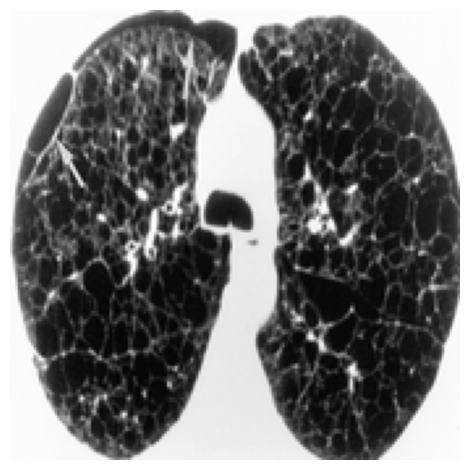

In [42]:
img = load(PATH_IMG)
disp(img.reshape(SHAPE_HR), "hr1.jpg")

In [43]:
# Get the list of LR images
y, shifts_true, angles_true = synthLRMultiple(img, SIGMA_AGN)
gamma_true = 2

A subdirectory or file LR already exists.


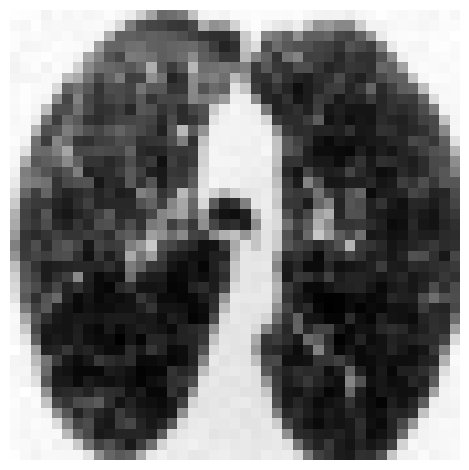

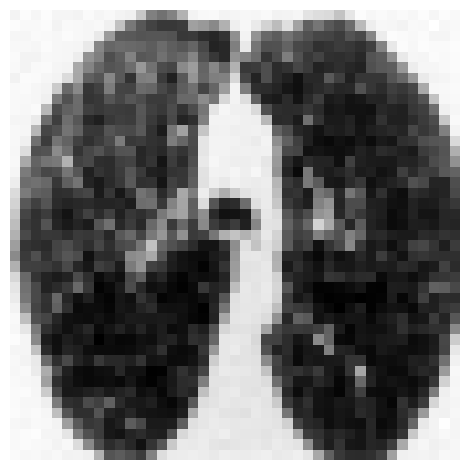

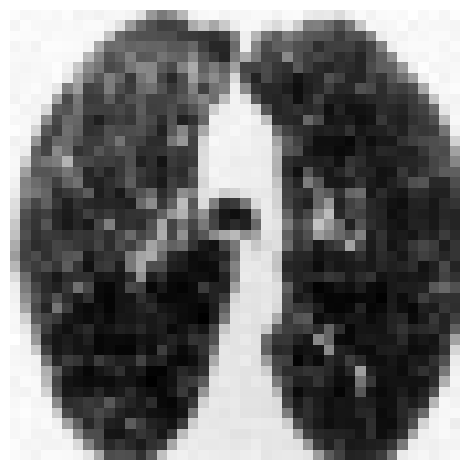

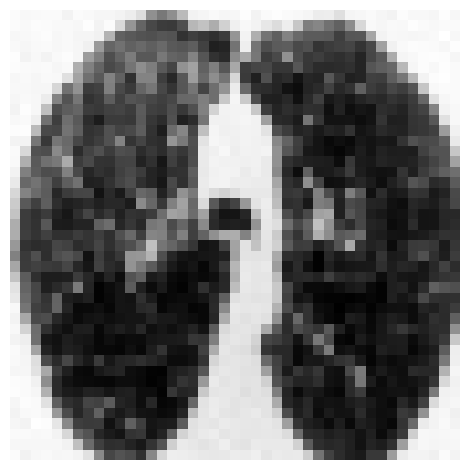

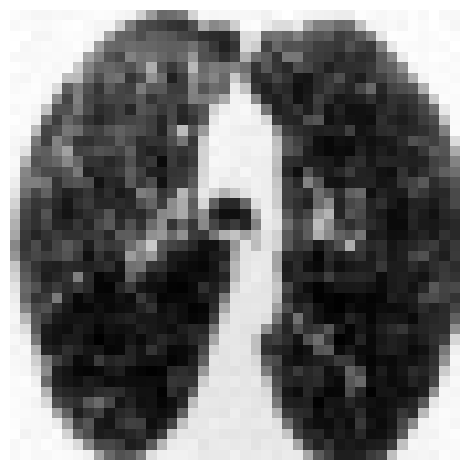

...

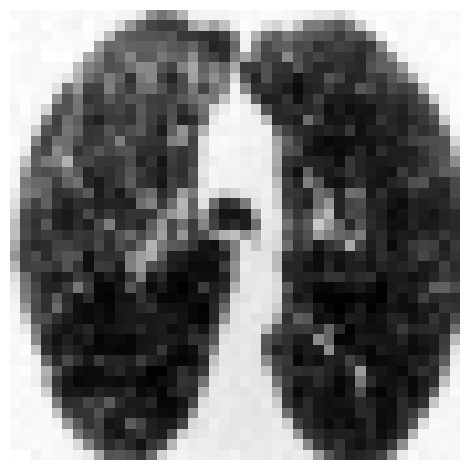

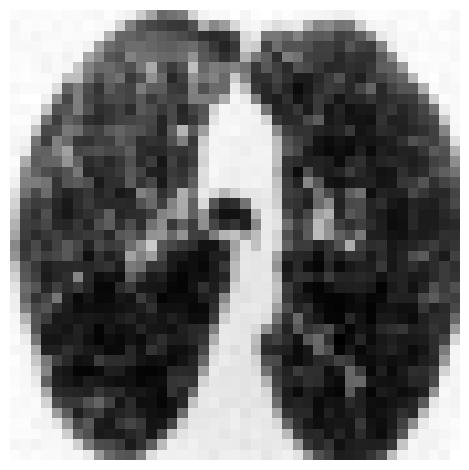

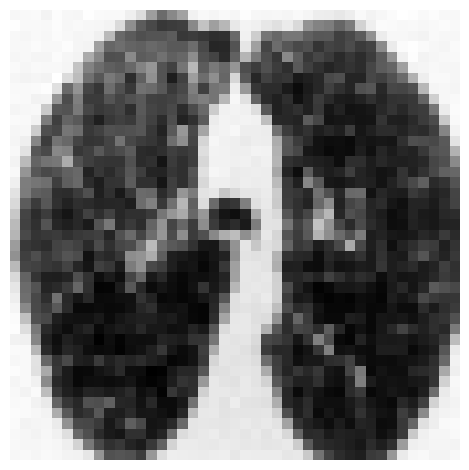

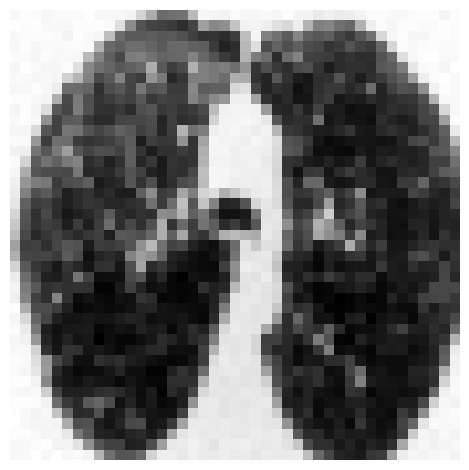

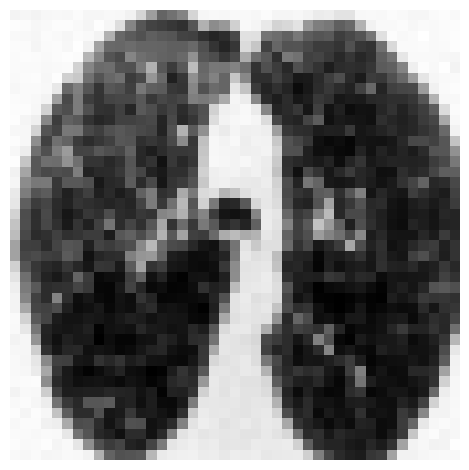

In [44]:
! mkdir LR
for k in range(K):
    disp(y[k].reshape(SHAPE_LR), f"LR/{k+1}.jpg")

In [45]:
! zip -r /content/LR.zip /content/LR

'zip' is not recognized as an internal or external command,
operable program or batch file.


### Crop the Input Images

In [46]:
y_patches = [getPatch(y[k], SHAPE_PATCH_LR, SHAPE_ORIG_LR, SHAPE_ORIG_LR[0]//2, SHAPE_ORIG_LR[1]//2) for k in range(K)]

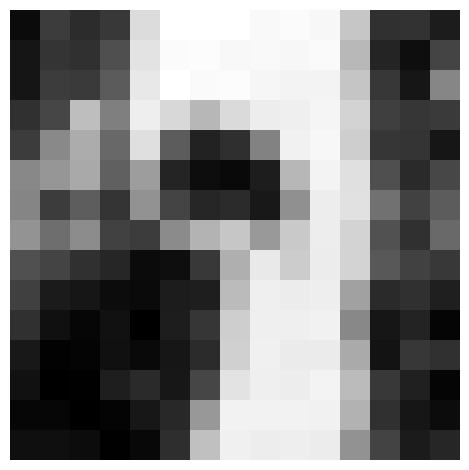

In [47]:
disp(y_patches[0].reshape(SHAPE_PATCH_LR), "patch.jpg")

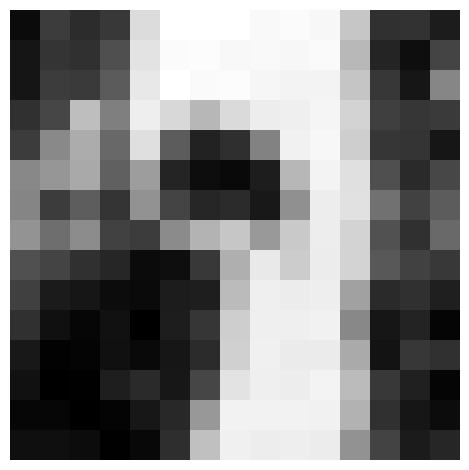

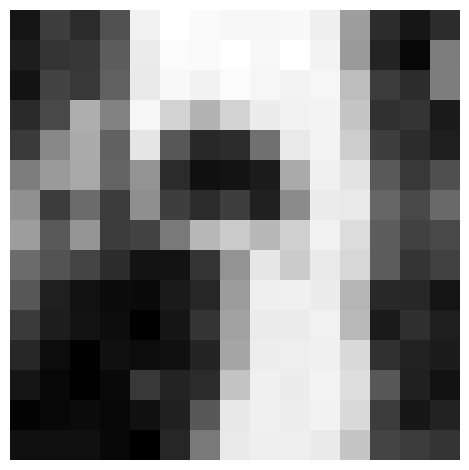

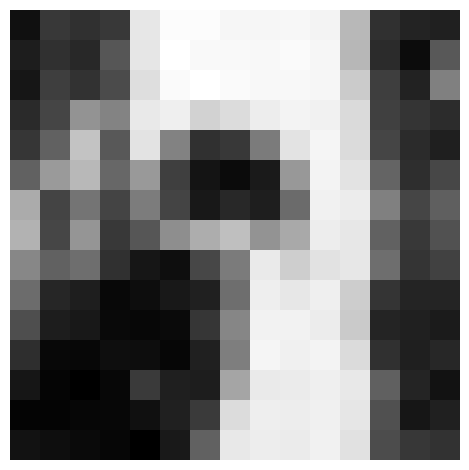

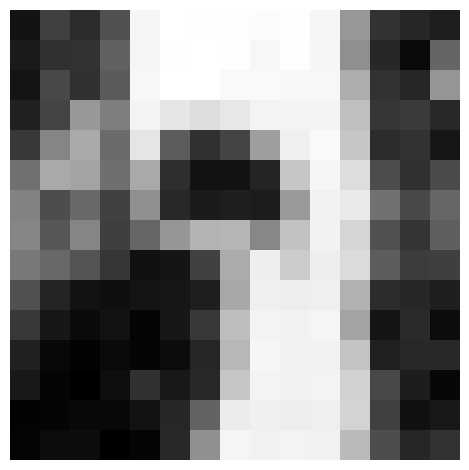

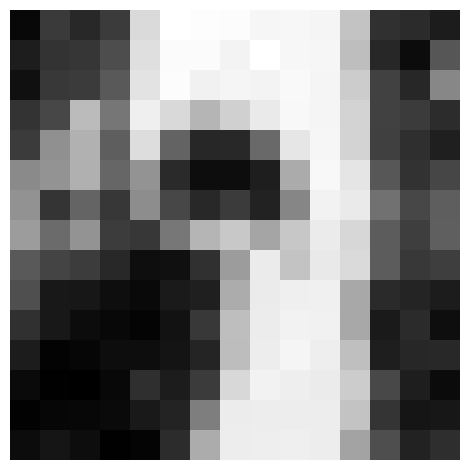

...

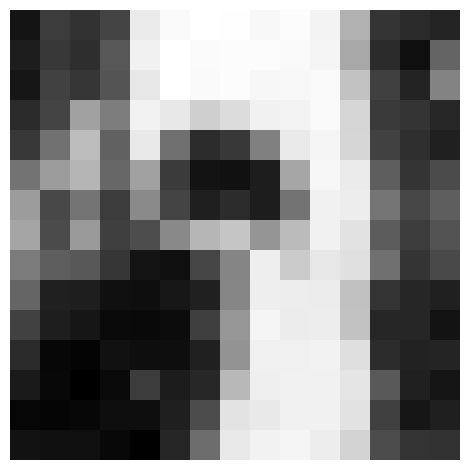

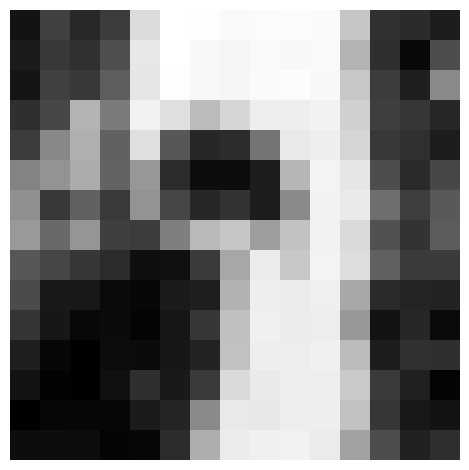

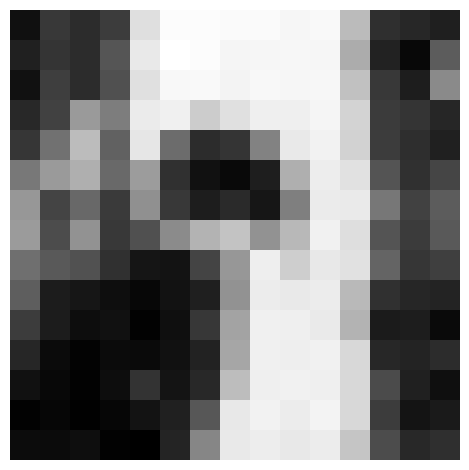

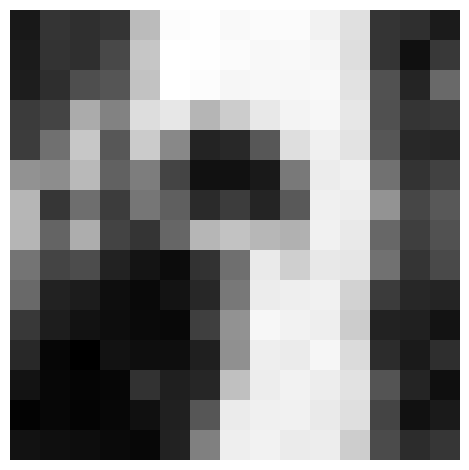

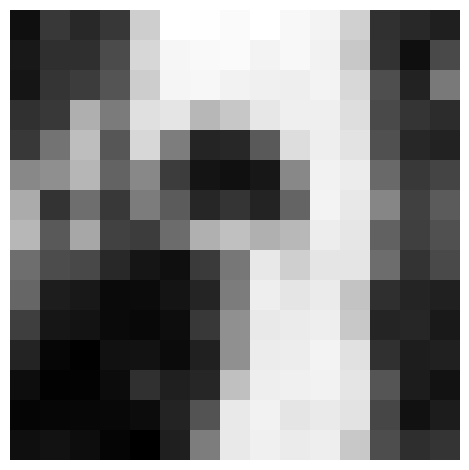

In [48]:
for k in range(K):
    disp(y_patches[k].reshape(SHAPE_PATCH_LR))

In [49]:
torch.cuda.empty_cache()

### Registration Parameters Estimation

In [50]:
SHAPE_HR = SHAPE_PATCH_HR
SHAPE_LR = SHAPE_PATCH_LR

N = SHAPE_HR[0] * SHAPE_HR[1]
M = SHAPE_LR[0] * SHAPE_LR[1]

CENTER_HR = [dim//2 for dim in SHAPE_HR]
CENTER_HR = torch.tensor(CENTER_HR, dtype = torch.float).reshape(2, 1).to(DEVICE)

V_HR  = positions(SHAPE_HR)
V_LR  = UPSCALE_FACTOR * positions(SHAPE_LR)
V_HR2 = torch.sum(V_HR**2, axis = 0).reshape(1, -1) # [1, N]

In [51]:
Zx = torch.empty(N, N, dtype = torch.float).to(DEVICE)
priorCovariance() 
Zx_inv = torch.inverse(Zx)
logdet_Zx = logdetSPD(Zx)

del Zx
torch.cuda.empty_cache() 

C:\Users\mefta\AppData\Local\Temp\ipykernel_9728\3540296956.py:2: UserWarning: torch.cholesky is deprecated in favor of torch.linalg.cholesky and will be removed in a future PyTorch release.
L = torch.cholesky(A)
should be replaced with
L = torch.linalg.cholesky(A)
and
U = torch.cholesky(A, upper=True)
should be replaced with
U = torch.linalg.cholesky(A).mH
This transform will produce equivalent results for all valid (symmetric positive definite) inputs. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\BatchLinearAlgebra.cpp:1703.)
  logdetSPD = lambda X : 2*torch.cholesky(X, upper = False).diagonal(dim1 = -2, dim2 = -1).log().sum(-1)


#### Optimize

In [52]:
shifts = np.zeros((K, 2, 1)) # [K, 2, 1]
shifts = shifts.tolist()
shifts = [torch.tensor(s, dtype = torch.float).to(DEVICE) for s in shifts]

In [53]:
angles = np.zeros((K, 1))
angles = angles.tolist()
angles = [torch.tensor(theta, dtype = torch.float).to(DEVICE) for theta in angles]

In [54]:
gamma = torch.tensor(UPSCALE_FACTOR, dtype = torch.float).to(DEVICE)
gamma.requires_grad  = True

In [55]:
params = [gamma]

for k in range(K):

    shifts[k].requires_grad = True
    params.append(shifts[k])

    angles[k].requires_grad = True
    params.append(angles[k])

In [59]:
N_EPOCH_MAX = 20
N_EPOCH_MIN = 60
EPS_CONVERGENCE = 1e-8
LR = 0.05 # 0.005 -> slower convergence, 0.5 -> everything goes wrong

optimizer = torch.optim.AdamW(
    params,
    lr = LR
)

In [62]:
losses = []
for i in tqdm(range(N_EPOCH_MAX)):

    optimizer.zero_grad()
    
    W = [transform(shifts[k], angles[k], gamma) for k in range(K)]
    C  = posteriorCovariance(W, SIGMA_AGN)
    mu = posteriorMean(y_patches, C, W, SIGMA_AGN)

    torch.cuda.empty_cache()

    loss = -1*marginalLogLikelihood(y_patches, W, C, mu, SIGMA_AGN)
    loss.backward()

    torch.cuda.empty_cache()

    if i > N_EPOCH_MIN:
        rel_change = relChange(losses[-1], loss.item())
        if rel_change < EPS_CONVERGENCE:
            print(f"Convergence reached, relative change in the last iteration: {rel_change}")
            break

    optimizer.step()

    loss_scalar = loss.item()
    losses.append(loss_scalar)
    print(f"Loss: {loss_scalar:.4f}") 

    torch.cuda.empty_cache()

  0%|          | 0/20 [00:00<?, ?it/s]

Loss: -11016.5664
Loss: -11158.6885
Loss: -11225.9912
Loss: -11281.4639
Loss: -11343.7773
Loss: -11400.1787
Loss: -11440.5059
Loss: -11469.2783
Loss: -11494.3311
Loss: -11514.8135
Loss: -11524.9443
Loss: -11524.3926
Loss: -11519.8477
Loss: -11518.2705
Loss: -11521.5605
Loss: -11526.8896
Loss: -11529.9932
Loss: -11528.3037
Loss: -11523.7158
Loss: -11521.1104


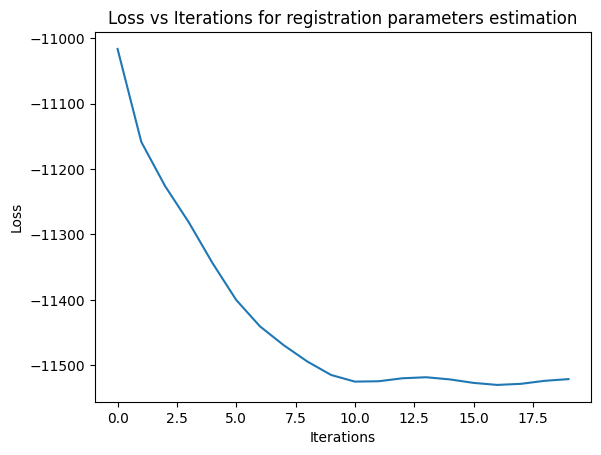

In [63]:
plt.plot(range(len(losses)), losses)
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Loss vs Iterations for registration parameters estimation")
plt.savefig("loss_reg_estimation.jpg", dpi = 100, bbox_inches = "tight", format = "jpg")
plt.show()

In [64]:
for p in params:
    p.requires_grad = False

In [65]:
shifts_list_est_x = []
shifts_list_est_y = []
shifts_list_true_x = []
shifts_list_true_y = []

angles_list_est = []
angles_list_true = []

In [66]:
for k in range(K):

    s_est = shifts[k].data.cpu().numpy()
    s_true = shifts_true[k].data.cpu().numpy()

    print(f"Shifts | True: {s_true} | Estimated: {s_est}")

    shifts_list_est_x.append(s_est[0])
    shifts_list_est_y.append(s_est[1])

    shifts_list_true_x.append(s_true[0])
    shifts_list_true_y.append(s_true[1])

    a_true = angles_true[k].item()
    a_est = angles[k].item()

    print(f"Angles | True: {a_true:.4f} | Estimated: {a_est:.4f}\n")

    angles_list_est.append(a_est)
    angles_list_true.append(a_true)

print(f"Gamma | True Gamma: {gamma_true} | Estimated: {gamma:.4f}")

Shifts | True: [[-0.16309784]
 [ 0.5859286 ]] | Estimated: [[-0.01554394]
 [ 0.5900539 ]]
Angles | True: -1.1744 | Estimated: -1.1549

Shifts | True: [[0.3015921 ]
 [0.12825602]] | Estimated: [[0.4144324]
 [0.1200093]]
Angles | True: 1.2120 | Estimated: 1.1385

Shifts | True: [[-0.44717577]
 [-0.44720712]] | Estimated: [[-0.31195197]
 [-0.39174604]]
Angles | True: 1.2572 | Estimated: 1.1639

Shifts | True: [[-0.5744913 ]
 [ 0.47602898]] | Estimated: [[-0.29532456]
 [ 0.49619544]]
Angles | True: 0.8327 | Estimated: 0.7760

Shifts | True: [[0.13144952]
 [0.27049434]] | Estimated: [[0.23553601]
 [0.24131691]]
Angles | True: -0.5275 | Estimated: -0.5363

Shifts | True: [[-0.6232402]
 [ 0.6108828]] | Estimated: [[-0.35980698]
 [ 0.6213132 ]]
Angles | True: -1.0863 | Estimated: -1.0087

Shifts | True: [[ 0.43217543]
 [-0.37395915]] | Estimated: [[ 0.4914776 ]
 [-0.39102498]]
Angles | True: 0.4974 | Estimated: 0.4496

Shifts | True: [[-0.41362754]
 [-0.41157413]] | Estimated: [[-0.2754048 ]
 

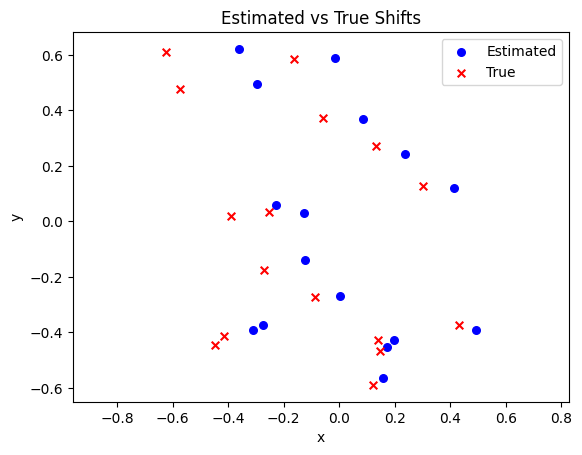

In [67]:
plt.scatter(shifts_list_est_x, shifts_list_est_y, s = 30, c = "b")
plt.scatter(shifts_list_true_x, shifts_list_true_y, s = 30, c = "r", marker = "x")
plt.axis("equal")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Estimated vs True Shifts")
plt.legend(["Estimated", "True"])
plt.savefig("estimated_shifts.jpg", dpi = 100, bbox_inches = "tight", format = "jpg")
plt.show()

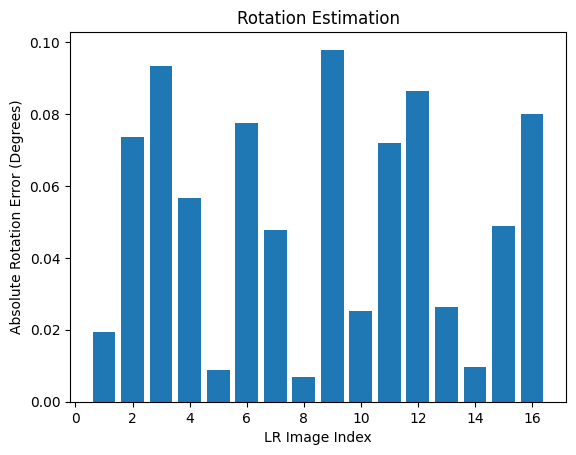

In [68]:
angles_diffs = []
for k in range(K):
    abs_diff = abs(angles_list_est[k] - angles_list_true[k])
    angles_diffs.append(abs_diff)

plt.bar(x = range(1, K+1), height = angles_diffs)
plt.xlabel("LR Image Index")
plt.ylabel("Absolute Rotation Error (Degrees)")
plt.title("Rotation Estimation")
plt.savefig("estimated_angles.jpg", dpi = 100, bbox_inches = "tight", format = "jpg")
plt.show()

In [69]:
torch.cuda.empty_cache()

## HR Image Estimation


In [70]:
SHAPE_HR = SHAPE_ORIG_HR
SHAPE_LR = SHAPE_ORIG_LR

N = SHAPE_HR[0] * SHAPE_HR[1]
M = SHAPE_LR[0] * SHAPE_LR[1]

CENTER_HR = [dim//2 for dim in SHAPE_HR]
CENTER_HR = torch.tensor(CENTER_HR, dtype = torch.float).reshape(2, 1).to(DEVICE)

# Pre-compute v_hr for reuse
V_HR  = positions(SHAPE_HR)
V_LR  = UPSCALE_FACTOR * positions(SHAPE_LR)
V_HR2 = torch.sum(V_HR**2, axis = 0).reshape(1, -1) # [1, N]

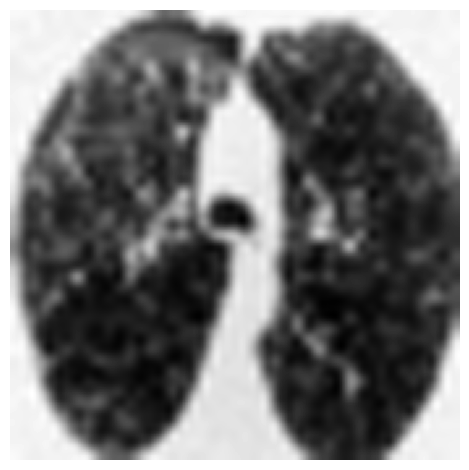

In [71]:
# Initial estimate for the HR image
X = y[0].reshape(SHAPE_LR) # Arbitrarily select the first image
X = X.data.cpu().numpy()
X = cv2.resize(X, (SHAPE_HR[1], SHAPE_HR[0]), interpolation = cv2.INTER_CUBIC)
disp(X, "sr_cubic.jpg")

In [72]:
del Zx_inv
del logdet_Zx
torch.cuda.empty_cache()

In [73]:
if PRIOR2 == "GP":
    # Zx is constant throughout and thus is made global, thus, precompute Z_x, Z_x^{-1} and log(|Z_x)
    Zx = torch.empty(N, N, dtype = torch.float).to(DEVICE)
    priorCovariance() # Populates Zx
    Zx_inv = torch.inverse(Zx)
    logdet_Zx = logdetSPD(Zx)

    # We don't need Zx anymore
    del Zx
    torch.cuda.empty_cache() # after this, a total of 2.03 GB is occupied

In [74]:
X = X.reshape(N, 1)
X = torch.tensor(X, dtype = torch.float).to(DEVICE)
X = scale(X)
X.requires_grad = True

In [75]:
print("Initial PSNR: {:.3f}".format(PSNR(img, X).item()))

Initial PSNR: 17.387


In [76]:
W = [transform(shifts[k], angles[k], gamma) for k in range(K)] # actual MxN Ws, not patches

In [77]:
N_EPOCH_MAX = 100
N_EPOCH_MIN = 100
EPS_CONVERGENCE = 1e-8
LR = 0.05 

optimizer = torch.optim.AdamW(
    [X],
    lr = LR
)

In [78]:
! mkdir GIF

A subdirectory or file GIF already exists.


  0%|          | 0/100 [00:00<?, ?it/s]

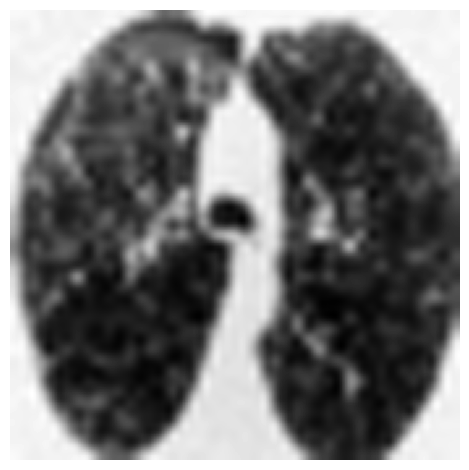

Loss: -1552893440.0000
Loss: -1553284992.0000


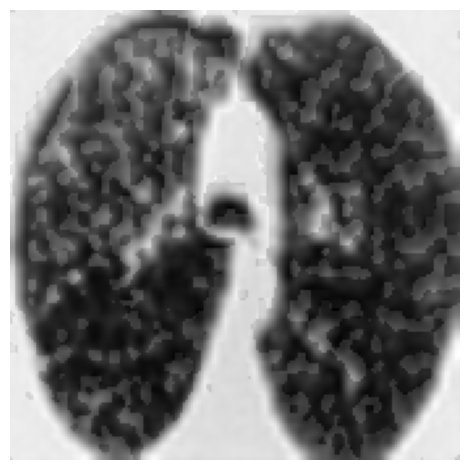

Loss: -1553474176.0000
Loss: -1553544704.0000


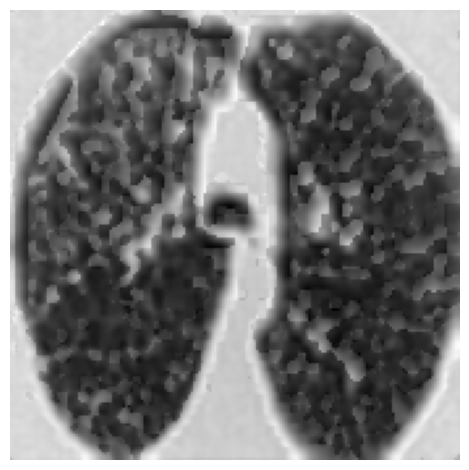

Loss: -1553558400.0000
Loss: -1553565056.0000


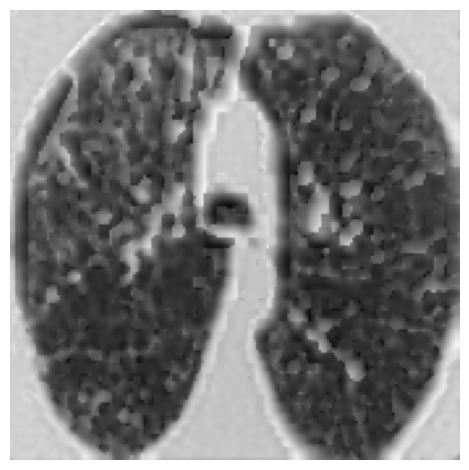

Loss: -1553574400.0000
Loss: -1553580672.0000


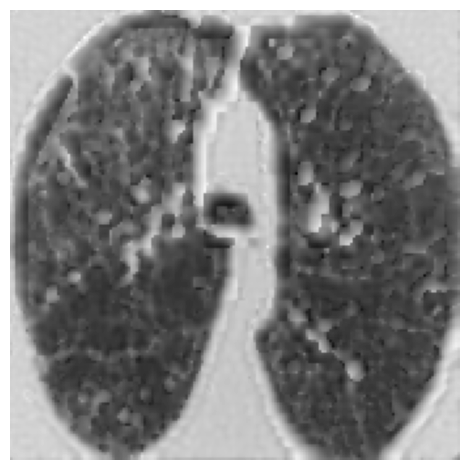

Loss: -1553583616.0000
Loss: -1553589120.0000


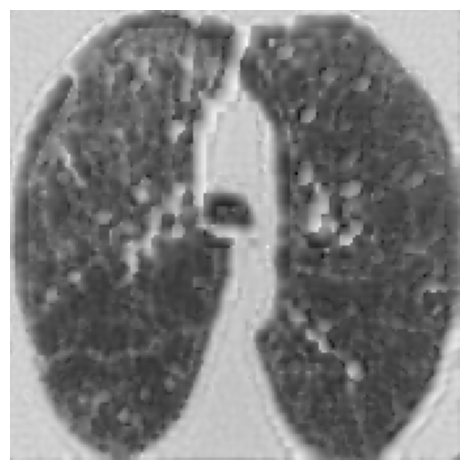

Loss: -1553599744.0000
Loss: -1553612032.0000


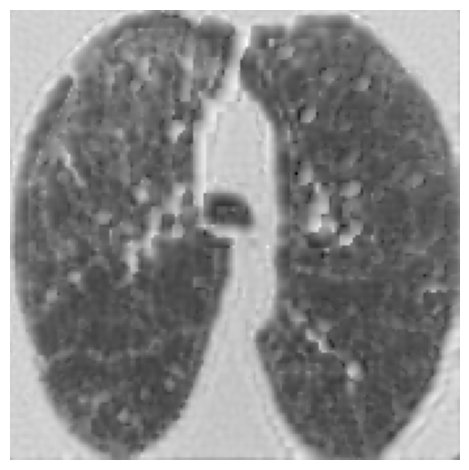

Loss: -1553622400.0000
Loss: -1553630720.0000


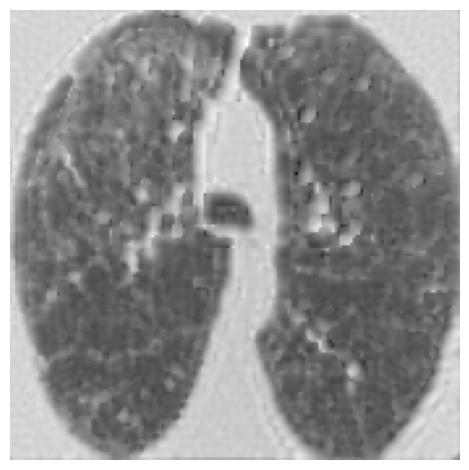

Loss: -1553639040.0000
Loss: -1553647232.0000


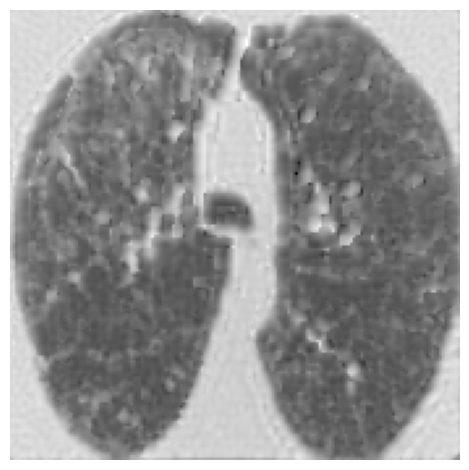

Loss: -1553653888.0000
Loss: -1553658112.0000


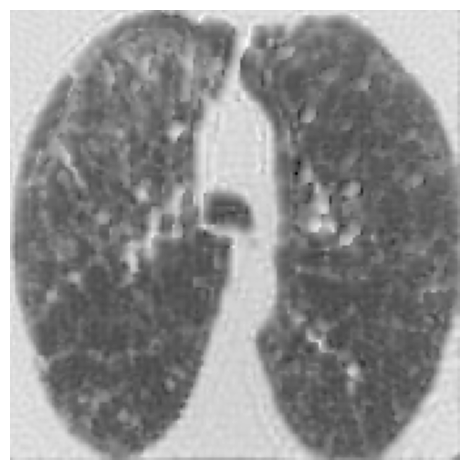

Loss: -1553660544.0000
Loss: -1553662720.0000


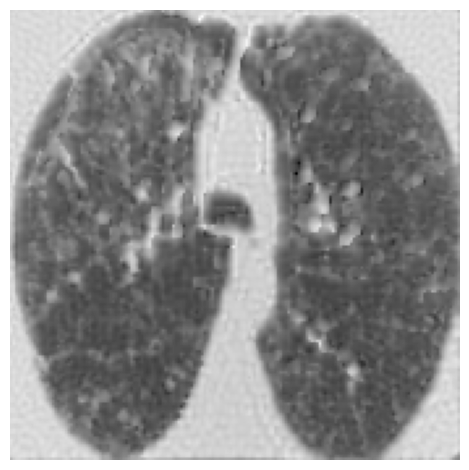

Loss: -1553664896.0000
Loss: -1553667200.0000


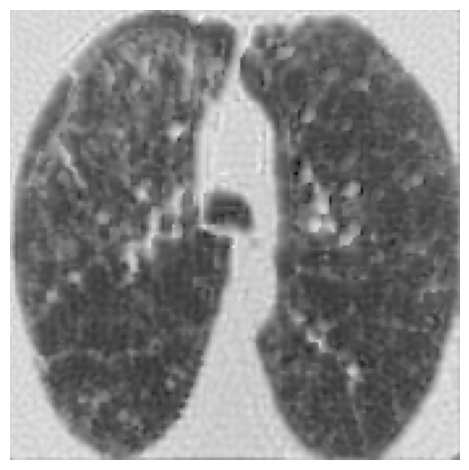

Loss: -1553669376.0000
Loss: -1553671552.0000


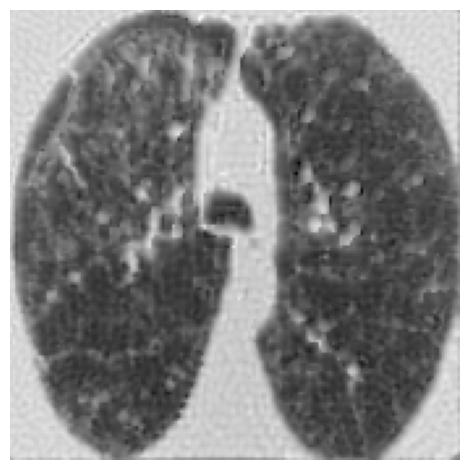

Loss: -1553673856.0000
Loss: -1553676032.0000


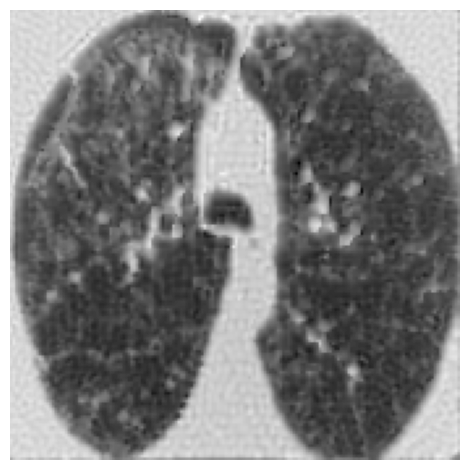

Loss: -1553677696.0000
Loss: -1553679232.0000


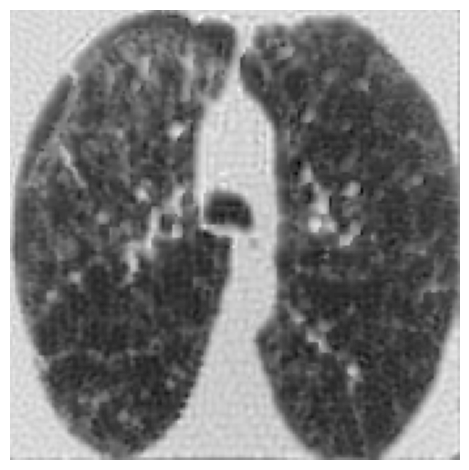

Loss: -1553680640.0000
Loss: -1553682048.0000


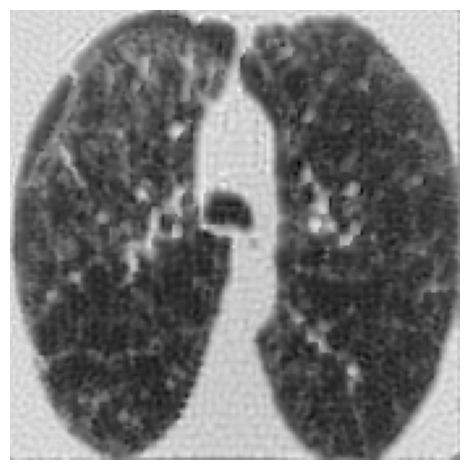

Loss: -1553683456.0000
Loss: -1553684480.0000


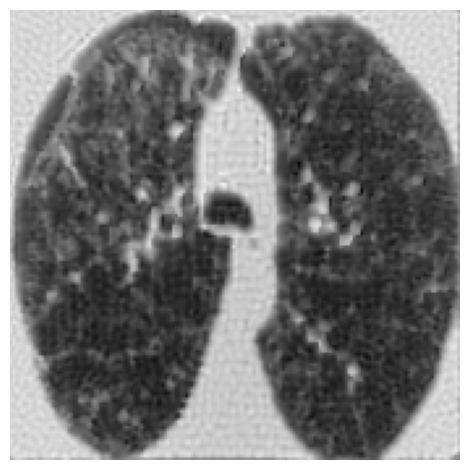

Loss: -1553685504.0000
Loss: -1553686272.0000


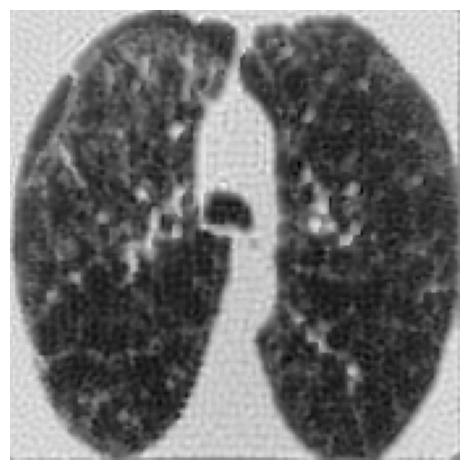

Loss: -1553686912.0000
Loss: -1553687424.0000


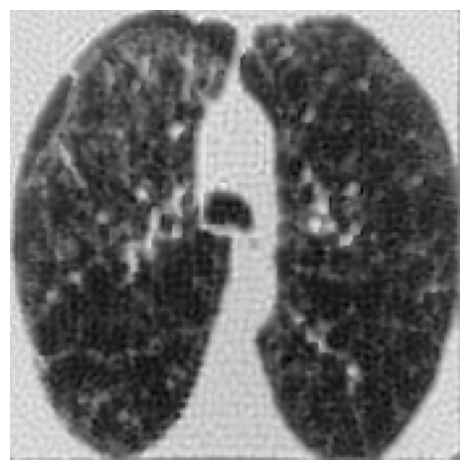

Loss: -1553687808.0000
Loss: -1553688320.0000


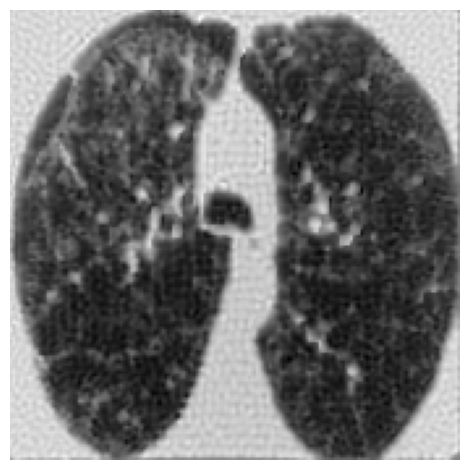

Loss: -1553688832.0000
Loss: -1553689344.0000


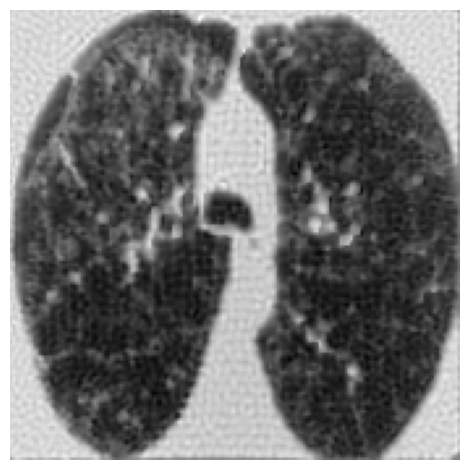

Loss: -1553689984.0000
Loss: -1553690496.0000


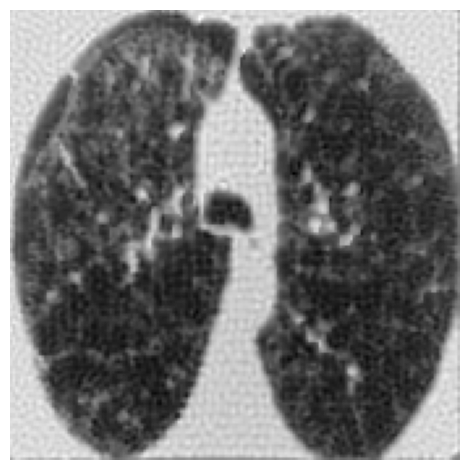

Loss: -1553690752.0000
Loss: -1553691136.0000


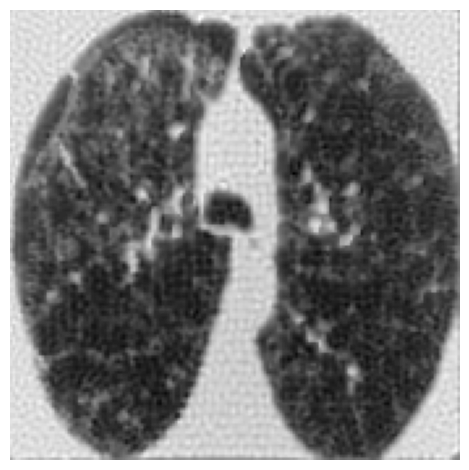

Loss: -1553691392.0000
Loss: -1553691648.0000


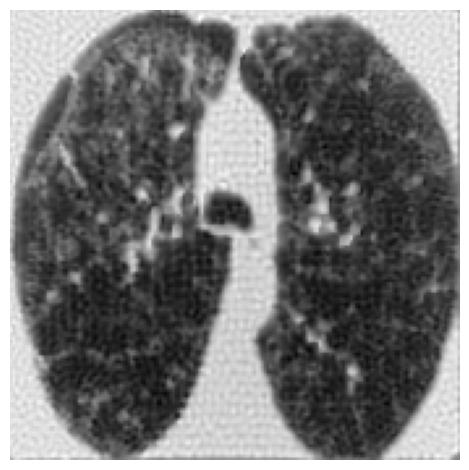

Loss: -1553691904.0000
Loss: -1553692160.0000


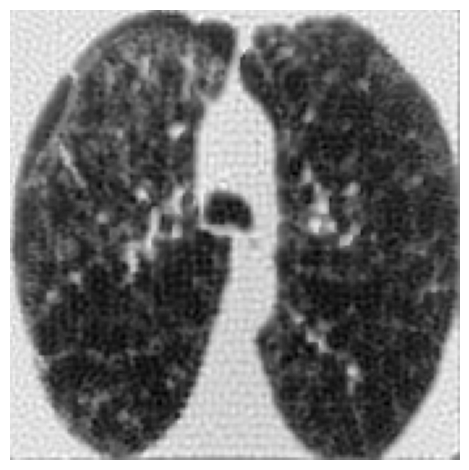

Loss: -1553692288.0000
Loss: -1553692416.0000


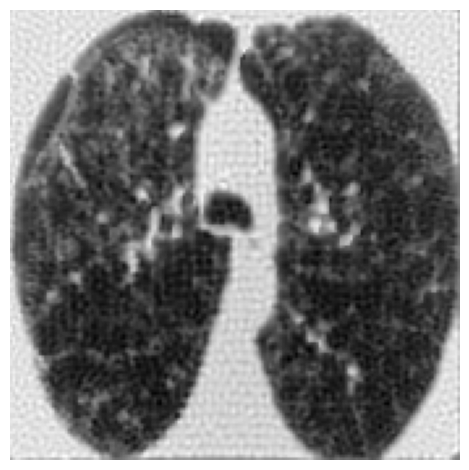

Loss: -1553692544.0000
Loss: -1553692800.0000


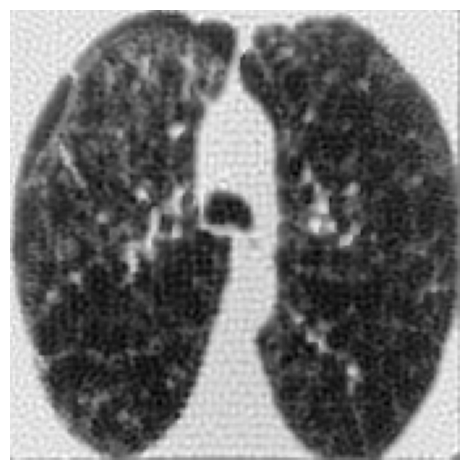

Loss: -1553692928.0000
Loss: -1553693056.0000


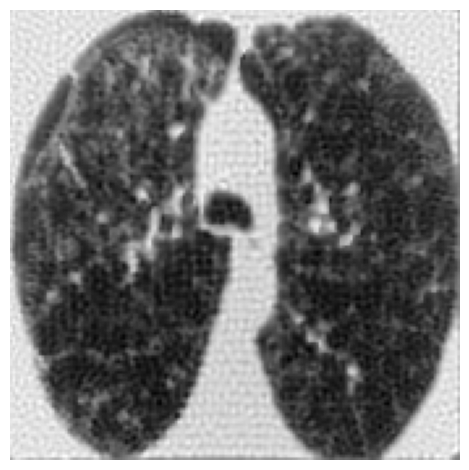

Loss: -1553693184.0000
Loss: -1553693312.0000


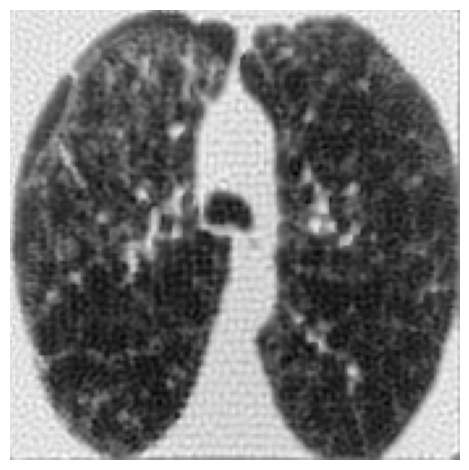

Loss: -1553693440.0000
Loss: -1553693440.0000


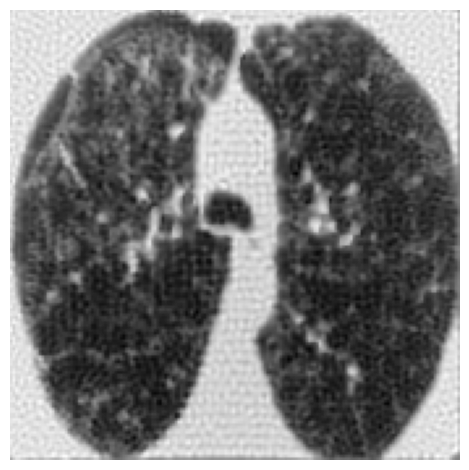

Loss: -1553693568.0000
Loss: -1553693568.0000


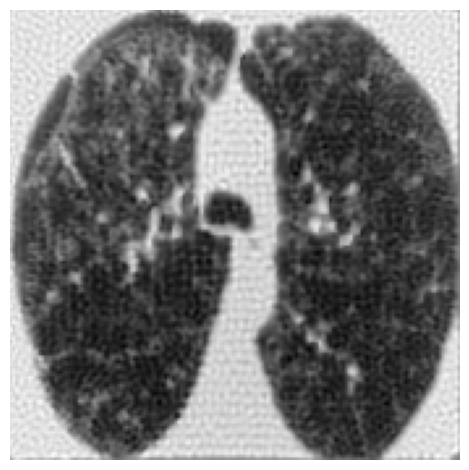

Loss: -1553693696.0000
Loss: -1553693696.0000


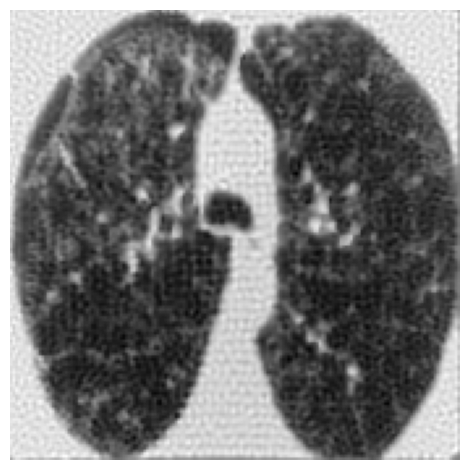

Loss: -1553693824.0000
Loss: -1553693824.0000


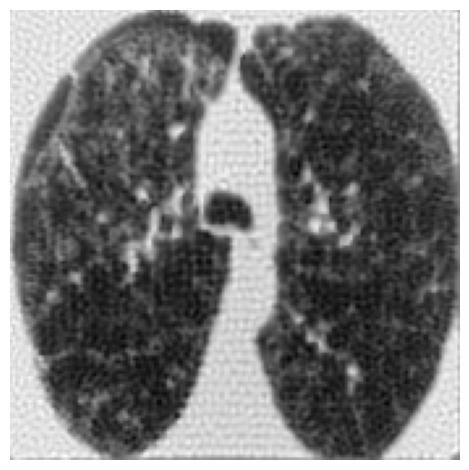

Loss: -1553693824.0000
Loss: -1553693952.0000


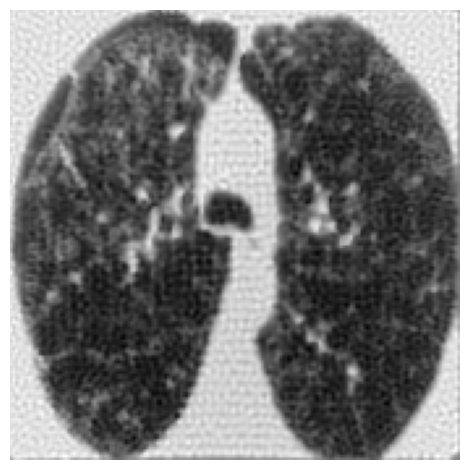

Loss: -1553693952.0000
Loss: -1553693952.0000


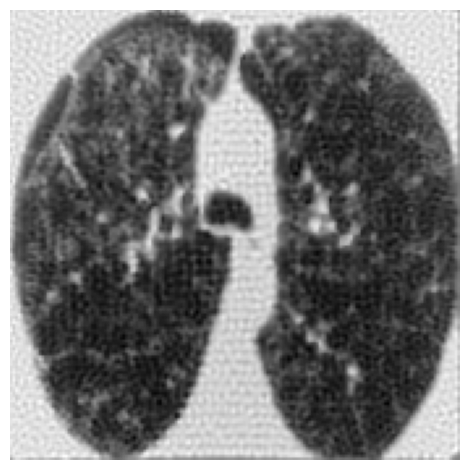

Loss: -1553694080.0000
Loss: -1553694080.0000


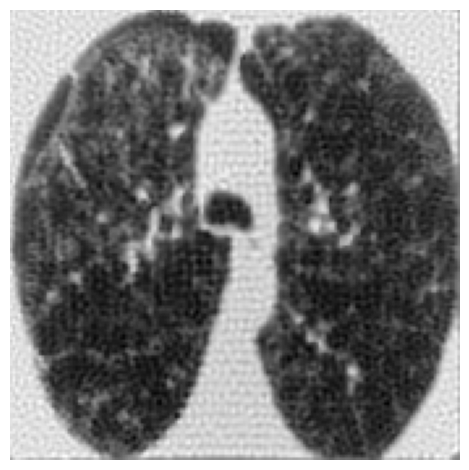

Loss: -1553694080.0000
Loss: -1553694080.0000


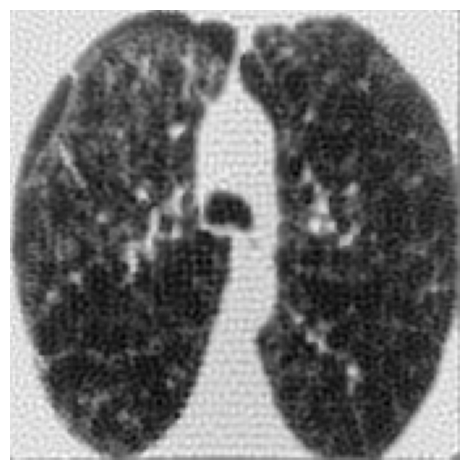

Loss: -1553694208.0000
Loss: -1553694080.0000


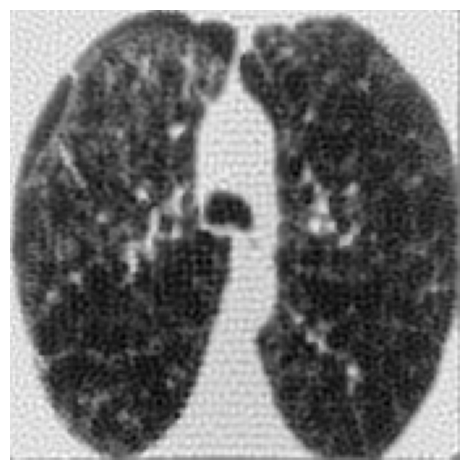

Loss: -1553694080.0000
Loss: -1553694080.0000


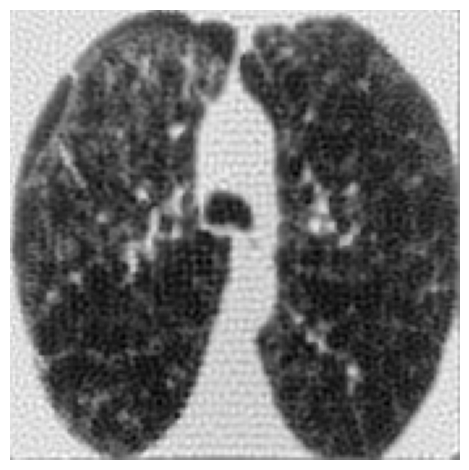

Loss: -1553694080.0000
Loss: -1553694080.0000


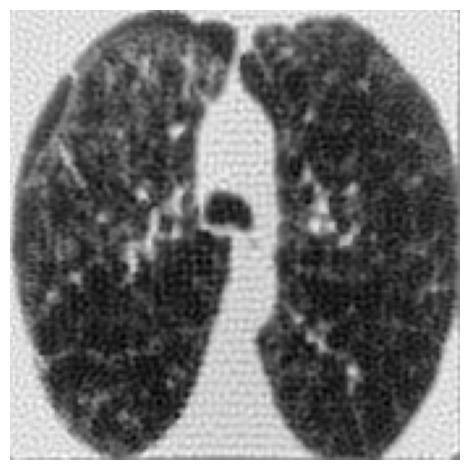

Loss: -1553694208.0000
Loss: -1553694208.0000


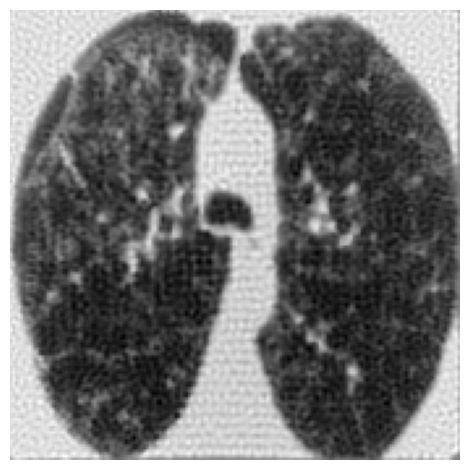

Loss: -1553694208.0000
Loss: -1553694208.0000


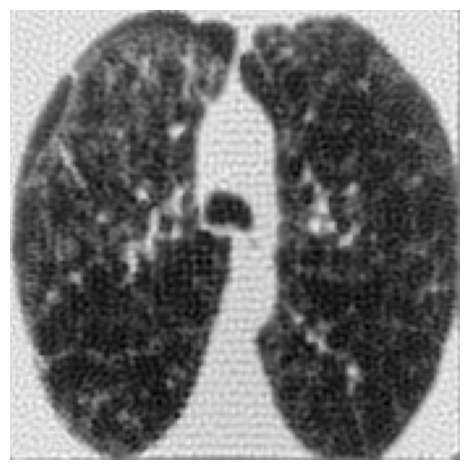

Loss: -1553694208.0000
Loss: -1553694208.0000


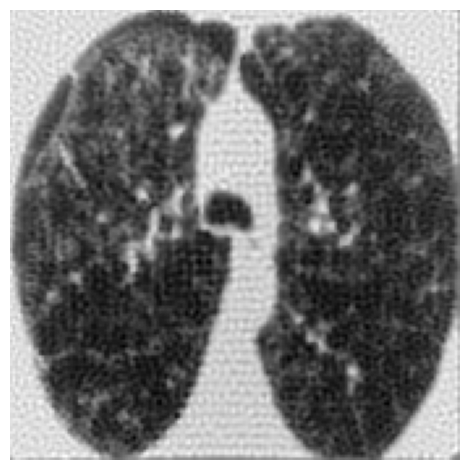

Loss: -1553694208.0000
Loss: -1553694208.0000


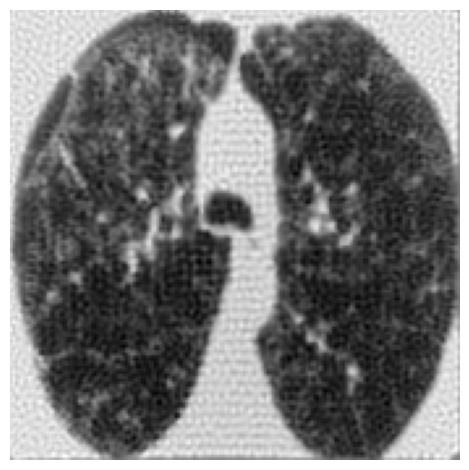

Loss: -1553694208.0000
Loss: -1553694208.0000


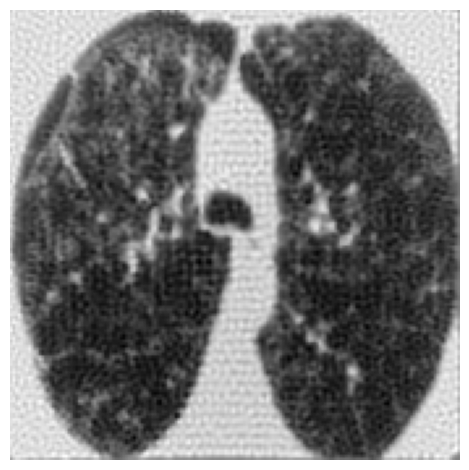

Loss: -1553694336.0000
Loss: -1553694336.0000


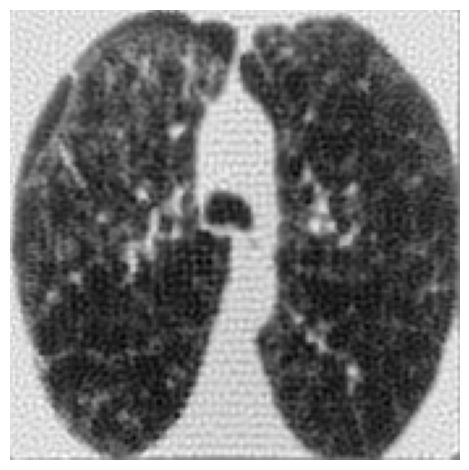

Loss: -1553694336.0000
Loss: -1553694336.0000


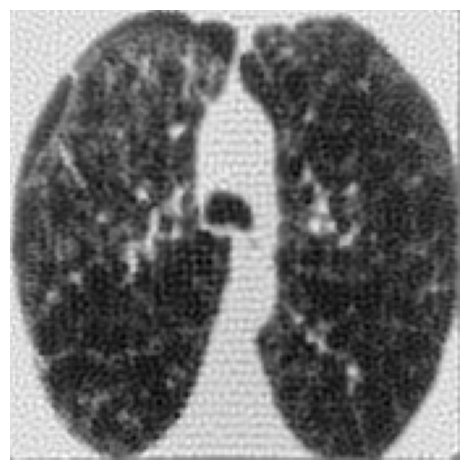

Loss: -1553694336.0000
Loss: -1553694336.0000


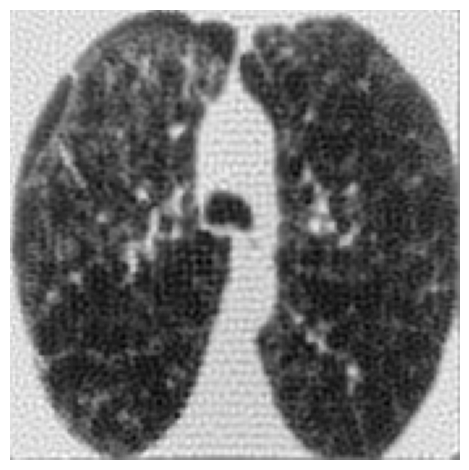

Loss: -1553694336.0000
Loss: -1553694336.0000


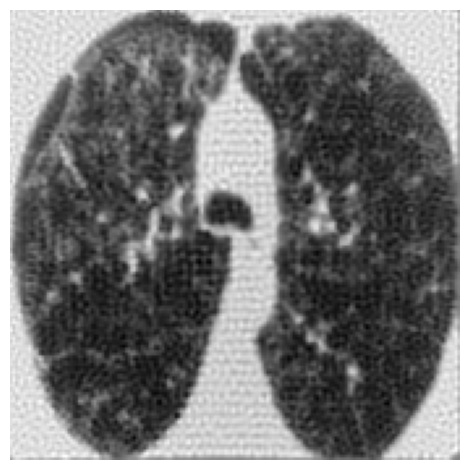

Loss: -1553694336.0000
Loss: -1553694336.0000


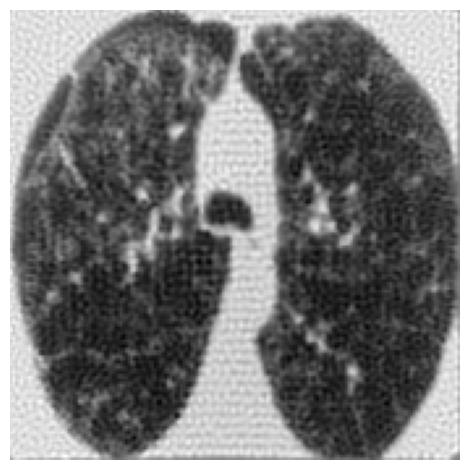

Loss: -1553694336.0000
Loss: -1553694336.0000


In [79]:
losses = []
for i in tqdm(range(N_EPOCH_MAX)):

    if i % 2 == 0:
        disp(X.reshape(SHAPE_HR), f"GIF/{i}.jpg")

    optimizer.zero_grad()

    torch.cuda.empty_cache()

    if PRIOR2 == "GP":
        loss = -1*logPosteriorGaussian(X, y, W, SIGMA_AGN)

    loss.backward()

    torch.cuda.empty_cache()

    if i > N_EPOCH_MIN:
        rel_change = relChange(losses[-1], loss.item())
        if rel_change < EPS_CONVERGENCE:
            print(f"Convergence reached, relative change in the last iteration: {rel_change}")
            break

    optimizer.step()
    
    loss_scalar = loss.item()
    losses.append(loss_scalar)
    print(f"Loss: {loss_scalar:.4f}") 

    torch.cuda.empty_cache()

In [80]:
X.requires_grad = False

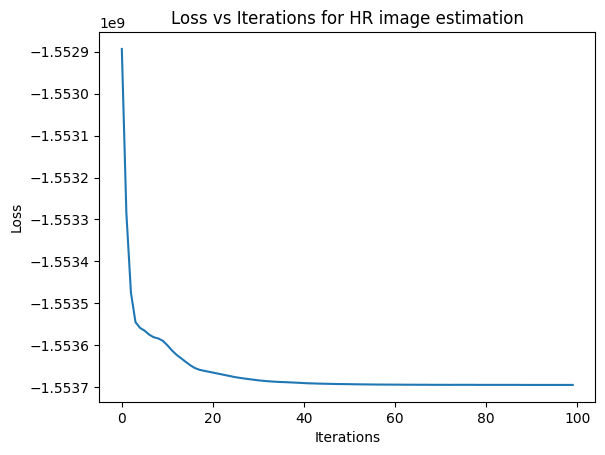

In [81]:
plt.plot(range(len(losses)), losses)
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Loss vs Iterations for HR image estimation")
plt.savefig("loss_hr_estimation.jpg", dpi = 100, bbox_inches = "tight", format = "jpg")
plt.show()

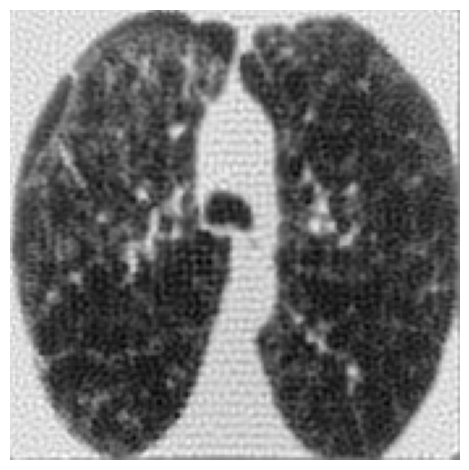

In [82]:
disp(X.reshape(SHAPE_HR), f"sr_{PRIOR2.lower()}_prior.jpg")

In [83]:
print("Final PSNR achieved: {:.3f}".format(PSNR(img, X).item()))

Final PSNR achieved: 18.815


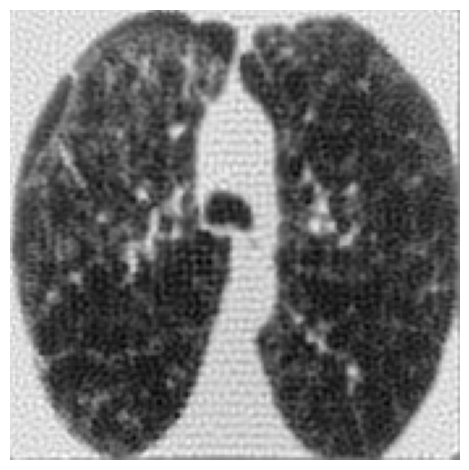

In [84]:
disp(X.reshape(SHAPE_HR), "GIF/100.jpg")

In [85]:

import imageio
images = []

for i in range(0, 100, 2):
    images.append(imageio.imread(f"GIF/{i}.jpg"))

imageio.mimsave("process.gif", images)

C:\Users\mefta\AppData\Local\Temp\ipykernel_9728\198737665.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(f"GIF/{i}.jpg"))
